# </center><br><center>${\textbf{Stocks & Prices Time Series Forecasting }}$</center>


${\textbf{Importing Libraries}}$

In [1]:
import warnings
warnings.simplefilter("ignore")

In [2]:
import glob
import os

In [3]:
import numpy as np
import pandas as pd
import pandas_profiling as pp
import pandas_datareader.data as web

In [4]:
from datetime import datetime
from concurrent import futures

In [5]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use("seaborn-whitegrid")
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [6]:
import xgboost as xgb
from xgboost import plot_importance, plot_tree

In [7]:
import statsmodels.api as sm

In [8]:
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV

${\textbf{Collecting  Data}}$

In [9]:
def download_stock(stock):
    """ try to query the iex for a stock, if failed note with print """
    try:
        print(stock)
        stock_df = web.DataReader(stock,'yahoo', start_time, now_time)
        stock_df['Name'] = stock
        output_name = stock + '_data.csv'
        stock_df.to_csv(output_name)
    except:
        bad_names.append(stock)
        print('bad: %s' % (stock))

In [10]:
now_time = datetime.now()
start_time = datetime(now_time.year - 5, now_time.month , now_time.day)
s_and_p=['AMZN','AAPL','GOOG','META','TSLA','NFLX']
bad_names =[]

In [11]:
max_workers = 50
workers = min(max_workers, len(s_and_p)) #in case a smaller number of stocks than threads was passed in
with futures.ThreadPoolExecutor(workers) as executor:
    res = executor.map(download_stock, s_and_p)
    if len(bad_names) > 0:
        with open('failed_queries.txt','w') as outfile:
            for name in bad_names:
                outfile.write(name+'\n')

    finish_time = datetime.now()
    duration = finish_time - now_time
    minutes, seconds = divmod(duration.seconds, 60)
    print(f'The threaded script took {minutes} minutes and {seconds} seconds to run.')

AMZN
AAPL
GOOG
META
TSLA
NFLX
The threaded script took 0 minutes and 0 seconds to run.


In [12]:
SP = pd.concat(map(pd.read_csv, glob.glob(os.path.join('', "*_data.csv"))))

<center>${\textbf{Data OverView}}$<center> 

${\textbf{Data Set Information: }}$
Stock market data can be interesting to analyze, and strong predictive models can have a large financial payoff. The amount of financial data available on the internet appears to be limitless. A large and well-structured dataset on a diverse set of companies can be difficult to come by. I've included a dataset with historical stock prices (over the last 20 years) for all companies currently included in the S&amp;P  index.<br>

${\textbf{Attribute Information: }}$
* Date - in format: yy-mm-dd
* Open - price of the stock at market open (this is NYSE data so all in USD)
* High - Highest price reached in the day
* Low Close - Lowest price reached in the day
* Volume - Number of shares traded
* Name - the stock's ticker name

${\textbf{Inspiration: }}$

This dataset lends itself well to some fascinating visualizations. Simple things like how prices change over time can be examined, as can graphing and comparing multiple stocks at the same time, or generating and graphing new metrics from the data provided.<br>
Stock statistics such as volatility and moving averages can be easily calculated using this data.<br>
The million-dollar question is whether you can create a model that outperforms the market and allows you to make statistically informed trades!<br>

<center>${\textbf{Global Exploratory Data Analysis: Global EDA}}$<center>

In [13]:
company_list = ['AMZN','AAPL','GOOG','META','TSLA','NFLX']

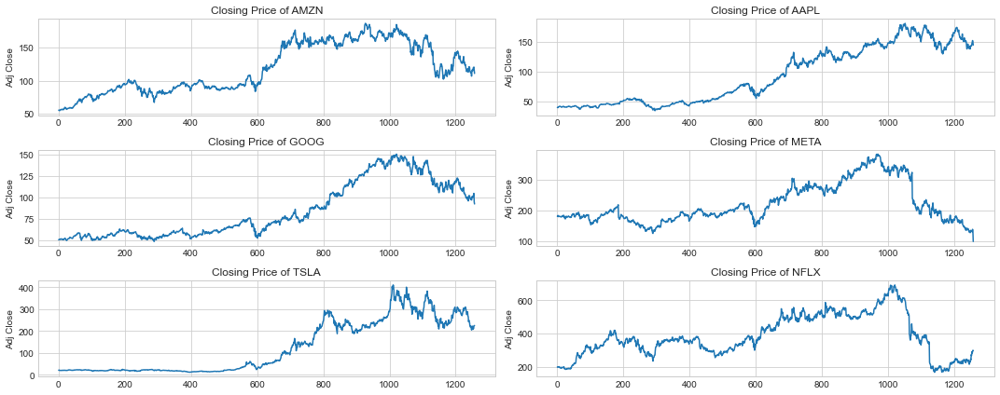

In [14]:
# Let's see a historical view of the closing price

plt.figure(figsize=(15, 6))
plt.subplots_adjust(top=1.25, bottom=1.2)
for i, company in enumerate(company_list, 1):
    plt.subplot(3, 2, i)
    company=SP[SP.Name==company]
    company['Adj Close'].plot()
    plt.ylabel('Adj Close')
    plt.xlabel(None)
    plt.title(f"Closing Price of {company_list[i - 1]}")
    
plt.tight_layout()

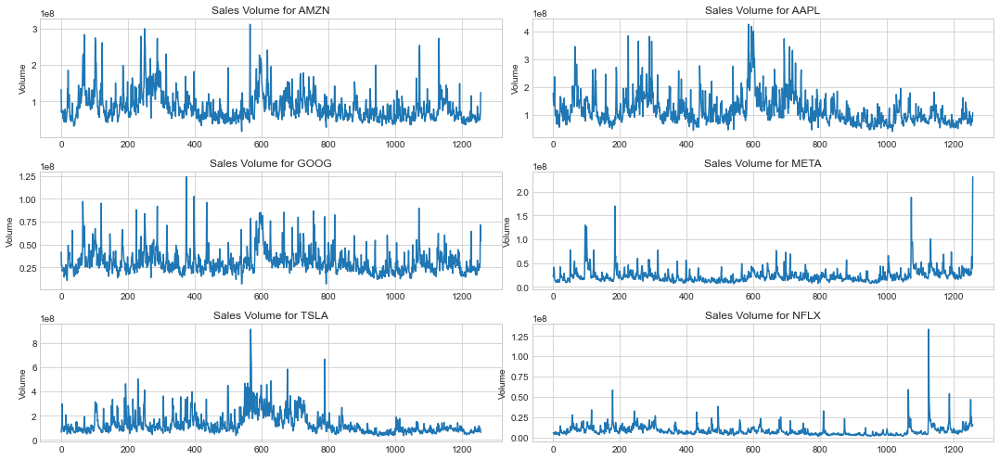

In [15]:
# Now let's plot the total volume of stock being traded each day
plt.figure(figsize=(15, 7))
plt.subplots_adjust(top=1.25, bottom=1.2)

for i, company in enumerate(company_list, 1):
    plt.subplot(3, 2, i)
    company=SP[SP.Name==company]
    company['Volume'].plot()
    plt.ylabel('Volume')
    plt.xlabel(None)
    plt.title(f"Sales Volume for {company_list[i - 1]}")
    
plt.tight_layout()

In [16]:
ma_day = [10, 20, 50]

for ma in ma_day:
    column_name = f"MA for {ma} days"
    SP[column_name] = SP['Adj Close'].rolling(ma).mean()

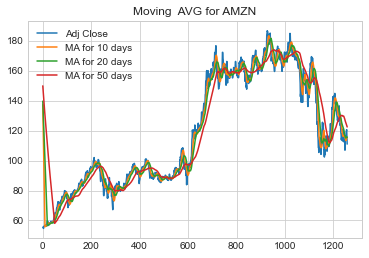

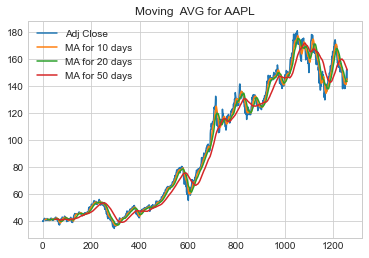

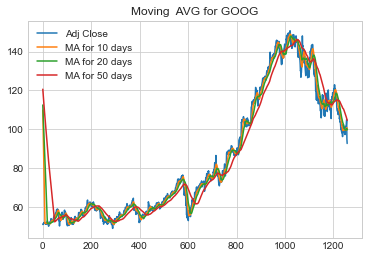

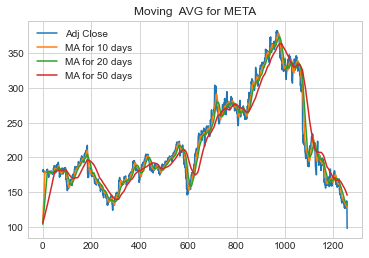

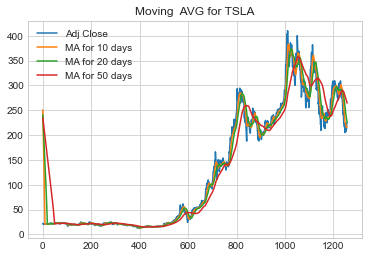

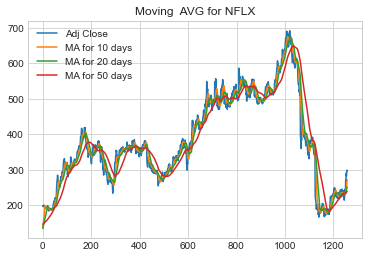

In [17]:
for i, company in enumerate(company_list, 1):
    company=SP[SP.Name==company]
    company[['Adj Close', 'MA for 10 days', 'MA for 20 days', 'MA for 50 days']].plot()
    plt.title(f"Moving  AVG for {company_list[i - 1]}")


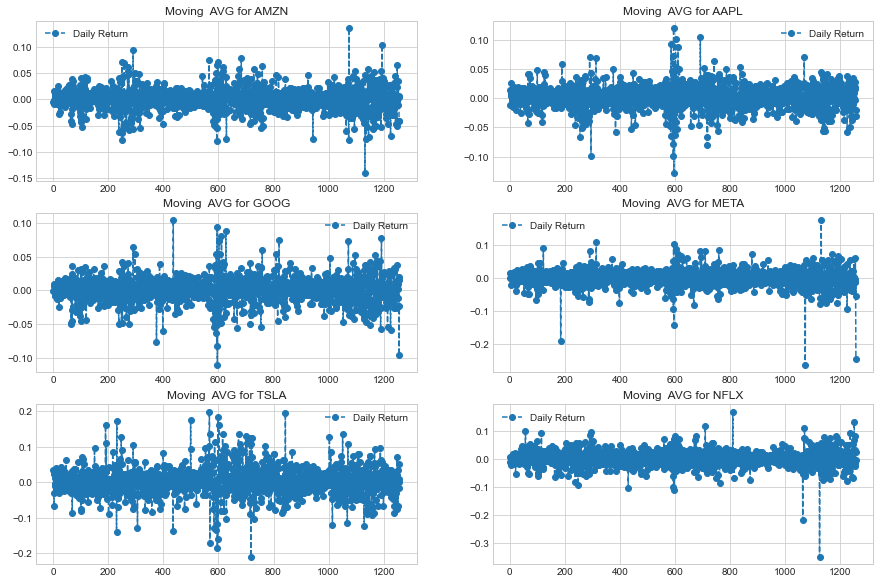

In [18]:
plt.figure(figsize=(15, 10))
for i, company in enumerate(company_list, 1):
    company=SP[SP.Name==company]
    company['Daily Return'] = company['Adj Close'].pct_change()
    plt.subplot(3, 2, i)
    company['Daily Return'].plot(legend=True, linestyle='--', marker='o')
    plt.title(f"Moving  AVG for {company_list[i - 1]}")


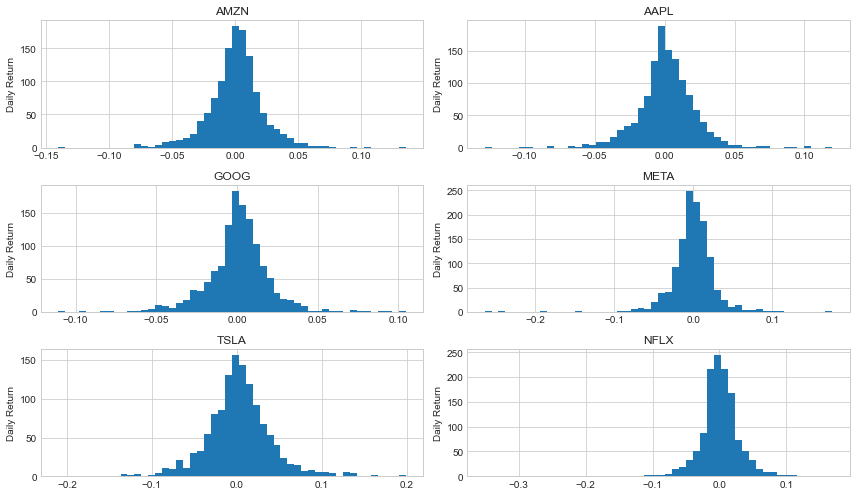

In [19]:
plt.figure(figsize=(12, 7))

for i, company in enumerate(company_list, 1):
    plt.subplot(3, 2, i)
    company=SP[SP.Name==company]
    company['Daily Return'] = company['Adj Close'].pct_change()
    company['Daily Return'].hist(bins=50)
    plt.ylabel('Daily Return')
    plt.title(f'{company_list[i - 1]}')
    
plt.tight_layout()

<center>${\textbf{Amazon Exploratory Data Analysis: Amazon EDA}}$<center>

In [20]:
AMZN = SP.loc[SP['Name'] == 'AMZN']
AMZN.loc[:, 'Date'] = pd.to_datetime(AMZN.loc[:,'Date'], format="%Y/%m/%d")

In [21]:
print(AMZN.shape)
AMZN.info()

(1258, 11)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 1258 entries, 0 to 1257
Data columns (total 11 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Date            1258 non-null   datetime64[ns]
 1   High            1258 non-null   float64       
 2   Low             1258 non-null   float64       
 3   Open            1258 non-null   float64       
 4   Close           1258 non-null   float64       
 5   Volume          1258 non-null   float64       
 6   Adj Close       1258 non-null   float64       
 7   Name            1258 non-null   object        
 8   MA for 10 days  1258 non-null   float64       
 9   MA for 20 days  1258 non-null   float64       
 10  MA for 50 days  1258 non-null   float64       
dtypes: datetime64[ns](1), float64(9), object(1)
memory usage: 117.9+ KB


In [22]:
AMZN.head()

,Date,High,Low,Open,Close,Volume,Adj Close,Name,MA for 10 days,MA for 20 days,MA for 50 days
0,2017-10-30,56.139500,54.678001,54.750500,55.542500,132262000.0,55.542500,AMZN,137.216251,139.587125,149.796249
1,2017-10-31,55.527000,55.056000,55.450001,55.264000,69540000.0,55.264000,AMZN,128.501651,135.227825,147.471129
2,2017-11-01,55.448502,54.837002,55.270000,55.183998,75110000.0,55.183998,AMZN,119.645050,130.682025,145.223409
3,2017-11-02,55.097000,54.343498,54.890499,54.710999,73698000.0,54.710999,AMZN,110.730150,126.097575,142.973029
4,2017-11-03,55.633999,54.425999,54.557499,55.580002,75030000.0,55.580002,AMZN,101.949150,121.605075,140.734029


In [23]:
AMZN.tail()

,Date,High,Low,Open,Close,Volume,Adj Close,Name,MA for 10 days,MA for 20 days,MA for 50 days
1253,2022-10-21,119.589996,114.500000,114.790001,119.320000,55611900.0,119.320000,AMZN,113.800,115.3075,124.5274
1254,2022-10-24,120.389999,116.570000,119.980003,119.820000,49531500.0,119.820000,AMZN,114.415,115.5410,124.0528
1255,2022-10-25,121.320000,118.949997,119.650002,120.599998,50934600.0,120.599998,AMZN,115.254,115.8505,123.6012
1256,2022-10-26,119.349998,114.760002,116.000000,115.660004,68802300.0,115.660004,AMZN,115.530,115.7330,123.0188
1257,2022-10-27,114.120003,109.769997,113.919998,110.959999,124604900.0,110.959999,AMZN,115.373,115.5410,122.3960


In [24]:
pp.ProfileReport(AMZN)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [25]:
AMZN.describe().T

,count,mean,std,min,25%,50%,75%,max
High,1258.0,1.201445e+02,3.751503e+01,5.509700e+01,8.887463e+01,1.104683e+02,1.599308e+02,1.886540e+02
Low,1258.0,1.171848e+02,3.660313e+01,5.434350e+01,8.715750e+01,1.063073e+02,1.562250e+02,1.848395e+02
Open,1258.0,1.187371e+02,3.709338e+01,5.455750e+01,8.802525e+01,1.080368e+02,1.583469e+02,1.872000e+02
Close,1258.0,1.186763e+02,3.701318e+01,5.471100e+01,8.809650e+01,1.078918e+02,1.580937e+02,1.865705e+02
Volume,1258.0,8.582080e+07,4.066756e+07,1.762600e+07,5.816550e+07,7.432500e+07,1.018995e+08,3.113460e+08
Adj Close,1258.0,1.186763e+02,3.701318e+01,5.471100e+01,8.809650e+01,1.078918e+02,1.580937e+02,1.865705e+02
MA for 10 days,1258.0,1.187873e+02,3.674861e+01,5.578410e+01,8.854690e+01,1.095840e+02,1.578995e+02,1.832754e+02
MA for 20 days,1258.0,1.188995e+02,3.648949e+01,5.655120e+01,8.852324e+01,1.110153e+02,1.581957e+02,1.815214e+02
MA for 50 days,1258.0,1.192481e+02,3.580867e+01,5.811477e+01,8.880831e+01,1.116054e+02,1.589153e+02,1.738487e+02


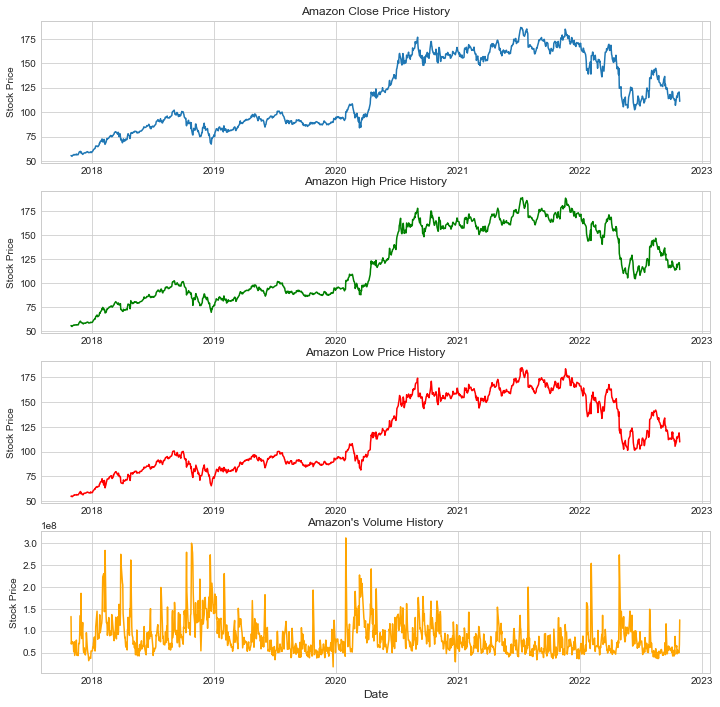

In [26]:
# Simple plotting of Amazon Stock Price
# First Subplot
f, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12,12))
ax1.plot(AMZN["Date"], AMZN["Close"])
ax1.set_ylabel("Stock Price")
ax1.set_title("Amazon Close Price History")

# Second Subplot
ax2.plot(AMZN["Date"], AMZN["High"], color="green")
ax2.set_ylabel("Stock Price")
ax2.set_title("Amazon High Price History")

# Third Subplot
ax3.plot(AMZN["Date"], AMZN["Low"], color="red")
ax3.set_ylabel("Stock Price")
ax3.set_title("Amazon Low Price History")

# Fourth Subplot
ax4.plot(AMZN["Date"], AMZN["Volume"], color="orange")
ax4.set_xlabel("Date", fontsize=12)
ax4.set_ylabel("Stock Price")
ax4.set_title("Amazon's Volume History")
plt.show()

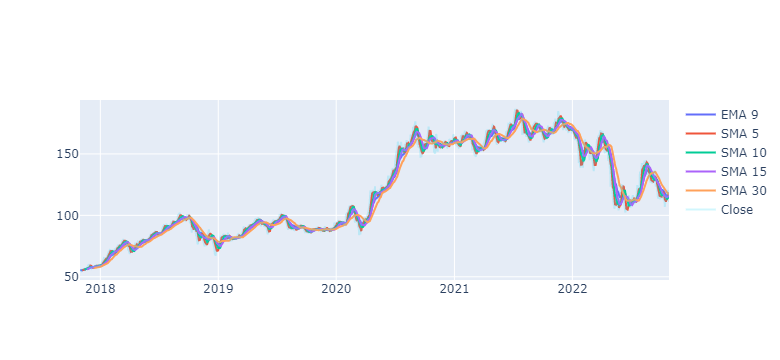

In [27]:
AMZN['EMA_9'] = AMZN['Close'].ewm(9).mean().shift()
AMZN['SMA_5'] = AMZN['Close'].rolling(5).mean().shift()
AMZN['SMA_10'] = AMZN['Close'].rolling(10).mean().shift()
AMZN['SMA_15'] = AMZN['Close'].rolling(15).mean().shift()
AMZN['SMA_30'] = AMZN['Close'].rolling(30).mean().shift()

fig = go.Figure()
fig.add_trace(go.Scatter(x=AMZN.Date, y=AMZN.EMA_9, name='EMA 9'))
fig.add_trace(go.Scatter(x=AMZN.Date, y=AMZN.SMA_5, name='SMA 5'))
fig.add_trace(go.Scatter(x=AMZN.Date, y=AMZN.SMA_10, name='SMA 10'))
fig.add_trace(go.Scatter(x=AMZN.Date, y=AMZN.SMA_15, name='SMA 15'))
fig.add_trace(go.Scatter(x=AMZN.Date, y=AMZN.SMA_30, name='SMA 30'))
fig.add_trace(go.Scatter(x=AMZN.Date, y=AMZN.Close, name='Close', opacity=0.2))
fig.show()

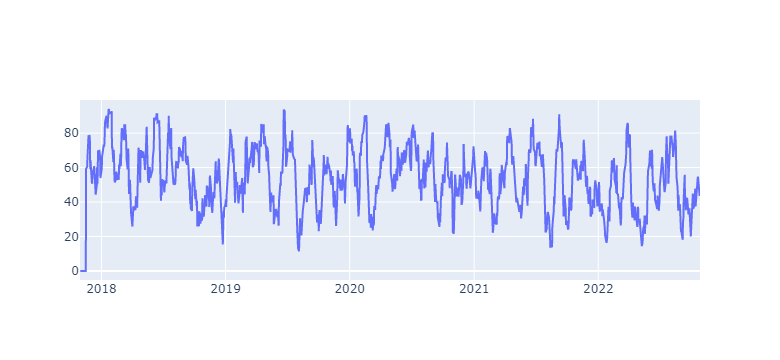

In [28]:
def relative_strength_idx(df, n=14):
    close = df['Close']
    delta = close.diff()
    delta = delta[1:]
    pricesUp = delta.copy()
    pricesDown = delta.copy()
    pricesUp[pricesUp < 0] = 0
    pricesDown[pricesDown > 0] = 0
    rollUp = pricesUp.rolling(n).mean()
    rollDown = pricesDown.abs().rolling(n).mean()
    rs = rollUp / rollDown
    rsi = 100.0 - (100.0 / (1.0 + rs))
    return rsi

AMZN['RSI'] = relative_strength_idx(AMZN).fillna(0)

fig = go.Figure(go.Scatter(x=AMZN.Date, y=AMZN.RSI, name='RSI'))
fig.show()

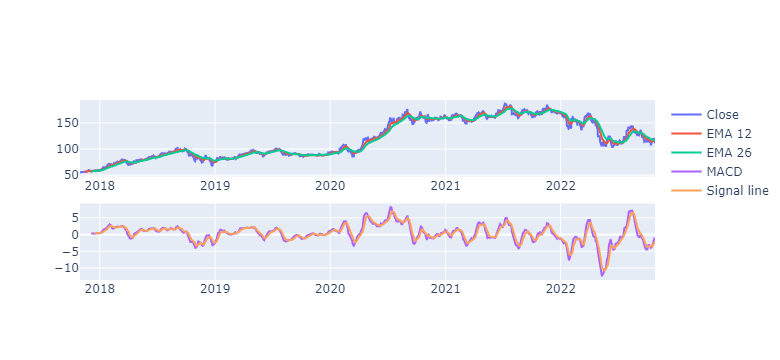

In [29]:
EMA_12 = pd.Series(AMZN['Close'].ewm(span=12, min_periods=12).mean())
EMA_26 = pd.Series(AMZN['Close'].ewm(span=26, min_periods=26).mean())
AMZN['MACD'] = pd.Series(EMA_12 - EMA_26)
AMZN['MACD_signal'] = pd.Series(AMZN.MACD.ewm(span=9, min_periods=9).mean())

fig = make_subplots(rows=2, cols=1)
fig.add_trace(go.Scatter(x=AMZN.Date, y=AMZN.Close, name='Close'), row=1, col=1)
fig.add_trace(go.Scatter(x=AMZN.Date, y=EMA_12, name='EMA 12'), row=1, col=1)
fig.add_trace(go.Scatter(x=AMZN.Date, y=EMA_26, name='EMA 26'), row=1, col=1)
fig.add_trace(go.Scatter(x=AMZN.Date, y=AMZN['MACD'], name='MACD'), row=2, col=1)
fig.add_trace(go.Scatter(x=AMZN.Date, y=AMZN['MACD_signal'], name='Signal line'), row=2, col=1)
fig.show()

<center>${\textbf{Data Modeling}}$<center>

${\textbf{XGBoost}}$

Shift label column
Because I want to predict the next day price, after calculating all features for day  $D_{i}$ , I shift Close price column by -1 rows.

In [30]:
AMZN['Close'] = AMZN['Close'].shift(-1)
AMZN = AMZN[:-1]      # Because of shifting close price

AMZN = AMZN.iloc[33:] # Because of moving averages and MACD line
AMZN = AMZN[:-1]      # Because of shifting close price

AMZN.index = range(len(AMZN))
AMZN

,Date,High,Low,Open,Close,Volume,Adj Close,Name,MA for 10 days,MA for 20 days,MA for 50 days,EMA_9,SMA_5,SMA_10,SMA_15,SMA_30,RSI,MACD,MACD_signal
0,2017-12-15,59.137501,58.466499,58.951500,59.528999,95572000.0,58.957001,AMZN,58.00595,58.072075,84.94064,57.927886,58.343900,57.92200,58.326167,57.361150,44.346597,0.357539,0.309134
1,2017-12-18,59.738998,59.045502,59.368500,59.368999,58952000.0,59.528999,AMZN,58.28910,58.223825,83.22262,58.033742,58.515301,58.00595,58.303300,57.502683,49.037107,0.425651,0.335240
2,2017-12-19,59.648499,58.957001,59.457500,58.881001,51756000.0,59.368999,AMZN,58.51815,58.376500,81.60820,58.187107,58.731901,58.28910,58.285800,57.634317,60.223976,0.461996,0.362974
3,2017-12-20,59.549999,58.799999,59.525002,58.737999,47424000.0,58.881001,AMZN,58.64450,58.471825,79.97742,58.308020,58.954900,58.51815,58.265067,57.745516,50.356637,0.448258,0.381289
4,2017-12-21,58.958500,58.382000,58.794998,58.417999,42462000.0,58.737999,AMZN,58.71935,58.518325,78.37258,58.366504,59.089800,58.64450,58.319567,57.836266,55.618932,0.421510,0.389801
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1218,2022-10-19,116.589996,113.220001,114.709999,115.250000,47198100.0,115.070000,AMZN,113.82900,115.133500,125.50260,116.224887,112.496001,114.41700,115.130000,119.573000,50.372821,-2.992256,-3.416531
1219,2022-10-20,118.239998,113.510002,113.830002,119.320000,48795100.0,115.250000,AMZN,113.32400,115.030500,124.95380,116.109399,112.930000,113.82900,114.934000,119.092667,53.252385,-2.721644,-3.277554
1220,2022-10-21,119.589996,114.500000,114.790001,119.820000,55611900.0,119.320000,AMZN,113.80000,115.307500,124.52740,116.023459,113.474001,113.32400,114.963999,118.607000,54.807158,-2.153938,-3.052831
1221,2022-10-24,120.389999,116.570000,119.980003,120.599998,49531500.0,119.820000,AMZN,114.41500,115.541000,124.05280,116.353113,115.958000,113.80000,115.385333,118.142000,47.956233,-1.644722,-2.771209


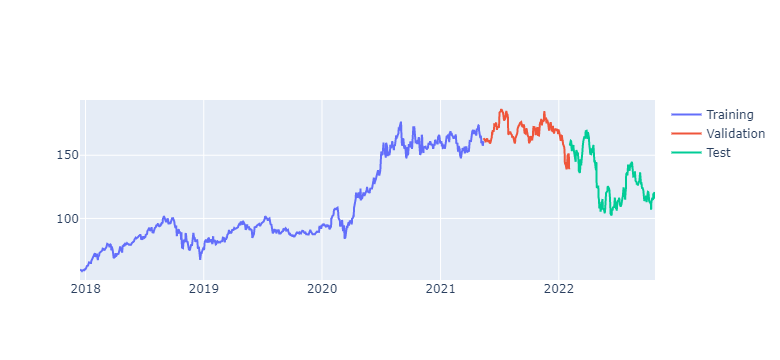

In [31]:
test_size  = 0.15
valid_size = 0.15

test_split_idx  = int(AMZN.shape[0] * (1-test_size))
valid_split_idx = int(AMZN.shape[0] * (1-(valid_size+test_size)))

train_df  = AMZN.loc[:valid_split_idx].copy()
valid_df  = AMZN.loc[valid_split_idx+1:test_split_idx].copy()
test_df   = AMZN.loc[test_split_idx+1:].copy()

fig = go.Figure()
fig.add_trace(go.Scatter(x=train_df.Date, y=train_df.Close, name='Training'))
fig.add_trace(go.Scatter(x=valid_df.Date, y=valid_df.Close, name='Validation'))
fig.add_trace(go.Scatter(x=test_df.Date,  y=test_df.Close,  name='Test'))
fig.show()

In [32]:
drop_cols = ['Date', 'Volume', 'Open', 'Low', 'High', 'Adj Close','Name','MA for 10 days','MA for 20 days','MA for 50 days']

train_df = train_df.drop(drop_cols, 1)
valid_df = valid_df.drop(drop_cols, 1)
test_df  = test_df.drop(drop_cols, 1)

In [33]:
y_train = train_df['Close'].copy()
X_train = train_df.drop(['Close'], 1)

y_valid = valid_df['Close'].copy()
X_valid = valid_df.drop(['Close'], 1)

y_test  = test_df['Close'].copy()
X_test  = test_df.drop(['Close'], 1)

X_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 857 entries, 0 to 856
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   EMA_9        857 non-null    float64
 1   SMA_5        857 non-null    float64
 2   SMA_10       857 non-null    float64
 3   SMA_15       857 non-null    float64
 4   SMA_30       857 non-null    float64
 5   RSI          857 non-null    float64
 6   MACD         857 non-null    float64
 7   MACD_signal  857 non-null    float64
dtypes: float64(8)
memory usage: 53.7 KB


In [34]:
def run_xgb(train_X, train_y, val_X, val_y):
    BestParams={
        'objective': 'reg:squarederror', 
        'eval_metric': 'rmse',
        "booster" :"gbtree",
        'tree_method': 'gpu_hist',
        'max_depth': 8,
        'eta': 0.01,
        'gamma': 0.01,
        'random_state': 42
    }
    progress = dict()
    tr_data = xgb.DMatrix(train_X, train_y)
    va_data = xgb.DMatrix(val_X, val_y)
    
    watchlist = [(tr_data, 'train'), (va_data, 'valid')]
    
    model_xgb = xgb.train(BestParams, tr_data, 800, watchlist, maximize=False, early_stopping_rounds = 200, verbose_eval=100,evals_result=progress)
    
    dtest = xgb.DMatrix(val_X)
    xgb_pred_y = model_xgb.predict(dtest, ntree_limit=model_xgb.best_ntree_limit)
    
    return xgb_pred_y, model_xgb,progress

In [35]:
%%time

pred_test_xgb, model,progress = run_xgb(X_train, y_train, X_valid, y_valid)
print("XGB Training Completed...")

[0]	train-rmse:111.14925	valid-rmse:166.86222
[100]	train-rmse:41.14827	valid-rmse:67.68034
[200]	train-rmse:15.46931	valid-rmse:29.80607
[300]	train-rmse:6.13497	valid-rmse:16.44763
[400]	train-rmse:2.74597	valid-rmse:12.19510
[500]	train-rmse:1.48422	valid-rmse:10.34332
[600]	train-rmse:0.98891	valid-rmse:9.66889
[700]	train-rmse:0.77129	valid-rmse:9.40365
[799]	train-rmse:0.64134	valid-rmse:9.20694
XGB Training Completed...
CPU times: total: 10.4 s
Wall time: 9.5 s


In [36]:
print(f'mean_squared_error = {mean_squared_error(y_test, pred_test_xgb)}')

mean_squared_error = 1210.8335425672497


In [37]:
print(f'y_true = {np.array(y_test)[:5]}')
print(f'y_pred = {pred_test_xgb[:5]}')

y_true = [157.63949585 157.9355011  161.41349792 161.1894989  159.00349426]
y_pred = [158.074   156.8878  155.52914 154.98366 153.2903 ]


<AxesSubplot:title={'center':'Feature importance'}, xlabel='F score', ylabel='Features'>

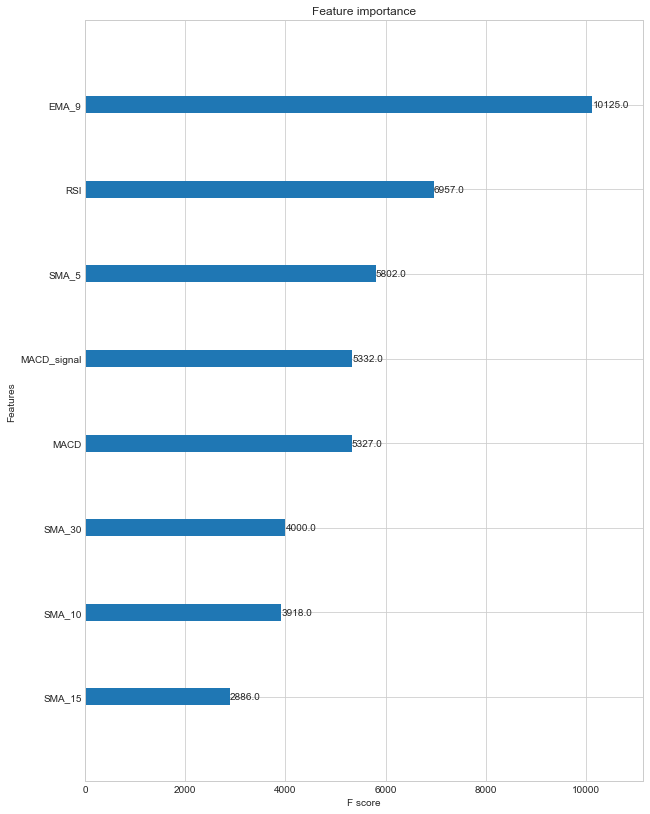

In [38]:
def plot_features(booster, figsize):    
    fig, ax = plt.subplots(1,1,figsize=figsize)
    return plot_importance(booster=booster, ax=ax)
plot_features(model, (10,14))

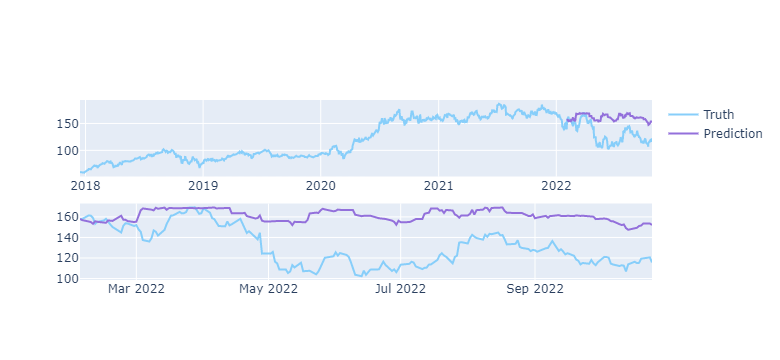

In [39]:
predicted_prices = AMZN.loc[test_split_idx+1:].copy()
predicted_prices['Close'] = pred_test_xgb

fig = make_subplots(rows=2, cols=1)
fig.add_trace(go.Scatter(x=AMZN.Date, y=AMZN.Close,
                         name='Truth',
                         marker_color='LightSkyBlue'), row=1, col=1)

fig.add_trace(go.Scatter(x=predicted_prices.Date,
                         y=predicted_prices.Close,
                         name='Prediction',
                         marker_color='MediumPurple'), row=1, col=1)

fig.add_trace(go.Scatter(x=predicted_prices.Date,
                         y=y_test,
                         name='Truth',
                         marker_color='LightSkyBlue',
                         showlegend=False), row=2, col=1)

fig.add_trace(go.Scatter(x=predicted_prices.Date,
                         y=pred_test_xgb,
                         name='Prediction',
                         marker_color='MediumPurple',
                         showlegend=False), row=2, col=1)

fig.show()

<Figure size 864x864 with 0 Axes>

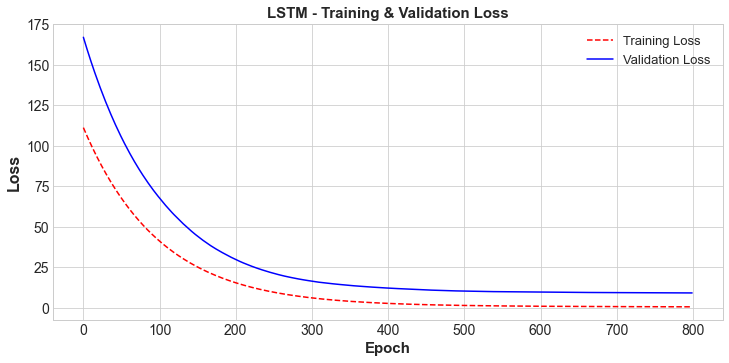

In [40]:
loss = list(progress["train"].items())
val_loss = list(progress["valid"].items())

plt.figure(figsize=(12, 12))
plt.figure(figsize=(12, 12))
plt.subplot(2, 1, 2)
plt.plot(loss[0][1],'r--', label='Training Loss' )
plt.plot(val_loss[0][1],'b',label='Validation Loss' )
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.legend(loc='upper right', fontsize=13)
plt.ylabel('Loss', fontsize=16, weight='bold')
plt.title('LSTM - Training & Validation Loss', fontsize=15, weight='bold')
# plt.yscale('log')
plt.xlabel('Epoch', fontsize=15, weight='bold')

plt.show()

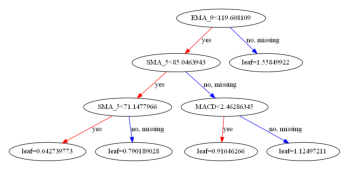

In [41]:
xgb.plot_tree(model,num_trees=0)
plt.rcParams['figure.figsize'] = [25, 25]
plt.show()